## Uproot

The standard library to read and write ROOT files in Python is the well (or not) know ROOT library but sometimes it can be difficult to understand or at least I had this promblem when doing it. 

Fortunately it exists an alternative which I found easier to work with and it's called uproot. Uproot is a library to create and work with ROOT files only using Numpy in Python, which is better known for most users. 

It has the advantage that it is an I/O library (Input/Output library) which means it's primarly designed to handle data reading and writting and its vision is focused to take the data from the ROOT files for machine learning libraries in Pyhton. 

Uproot does not depend on C++ ROOT. It works with the data using Numpy, "converting" the ROOT file into Numpy arrays. 

Uproot is actually really easy to install. You can do it by pip as follows:

The akward library is not completely necessary but it is recommended in order to manipulate JSON-like data with Numpy-like idioms (that is actually the description you found about this library)

More about Uproot can be check in: https://uproot.readthedocs.io/en/latest/index.html

The getting started guide is on: https://uproot.readthedocs.io/en/latest/basic.html

## About ROOT

From the ROOT primer you'll see that:
"ROOT is a software framework for data analysis and I/O: a powerful tool to cope with the demanding task typicial of state of the art scientific data analysis.

ROOT is better known for being the software used to store the data of most Large Hadron Collider experiments. But it actually has other features such as its advanced graphical user interface used for analysis. 

ROOT is an open source project coordinated by the Euroepan Organisation for Nuclear Research, CERN in Geneva. It was created in order to satisfice the necessity of a tool to visualice data, to make some manipulations on it, to have a powrful library of mathematical functions and procedures, to visualice the uncertainties of experiments, to do data analysis with the collected data, to analize a large data volume, to have and easy-to-use and efficient methods for storing and handling data, to generate and visualize frequency distributions, to simulate data (generation of pseudo-data) inter alia.

Many ROOT functions are desingned in C++, so a little knowledge about this language is needed. Although it has its equivalent in python, so one should be able to work with the ROOT library and it is very similar to the C++ workflow. 

More about ROOT can be found in: https://root.cern/primer/ 

## About Delphes

Delphes is a C++ basic framework for sumulations of generic collider experiments. It is fast and multipurpose for detector response simulation which includes a tracking system, embedded into a magnetic field, calorimeters and a muon system.

Delphes framework is based in standard file formats such as Les Houches Event File (a standard in event generators to define event listings in a common language) and HepMC, and outputs observables that can be used for analyses. The simulations tackes into account things as the effect of magnetic field among others. 

The visualization of the final state particles is built-in using the ROOT library. The output can be analyzed using the ROOT data analysis framework or alternatively using Uproot (which will be done in this work). In most cases it can be done with TTree draw or with ROOT macros.

##### The DELPHES 3 collaboration., de Favereau, J., Delaere, C. et al. DELPHES 3: a modular framework for fast simulation of a generic collider experiment. J. High Energ. Phys. 2014, 57 (2014). https://doi.org/10.1007/JHEP02(2014)057

## About TTrees

Ttree is a ROOT framework class used to save structured sets of data in high energy physics. It helps to manage huge data volumes dividing them into independent branches (TBranch) allowing the automatic compression and eficient reading of specific values without having to load all the file in the memory. 

A better reference about the TTree class in ROOT can be found in: https://root.cern.ch/doc/v636/classTTree.html 

## Root Tree Description

In https://delphes.github.io/workbook/root-tree-description/ one can find the description of all classes used to store output data. Take in account that moment units are GeV and position units are mm.

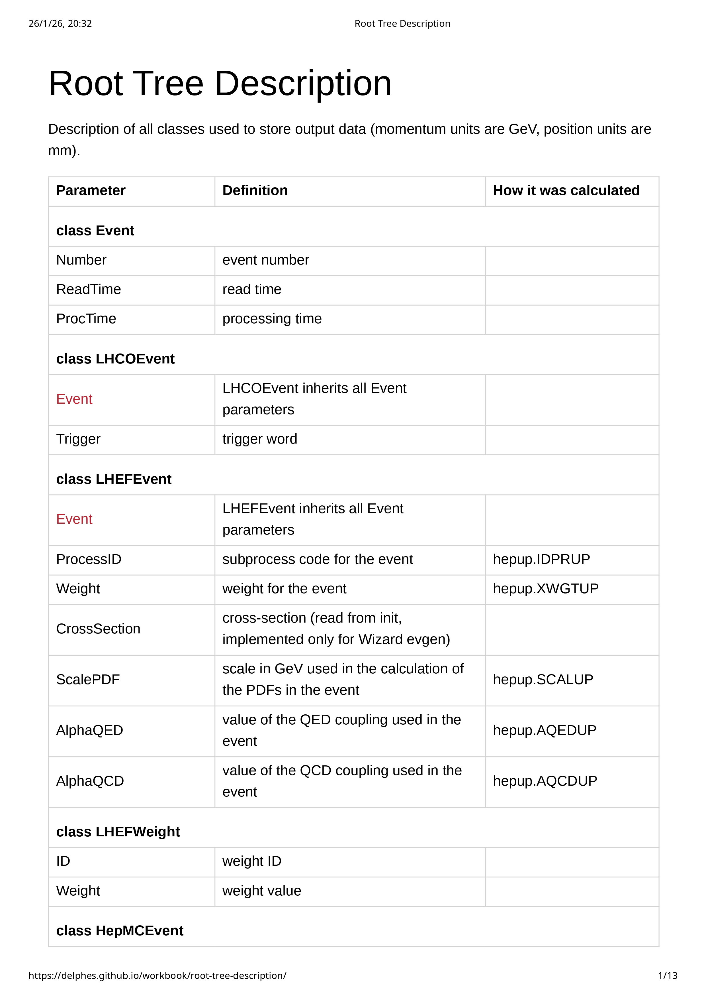

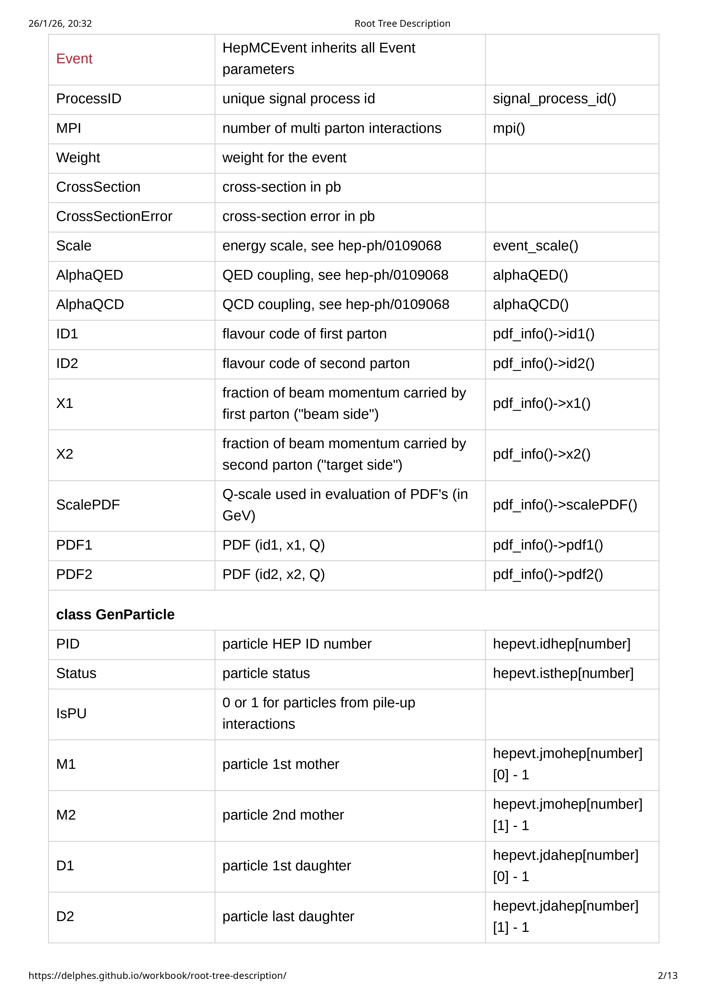

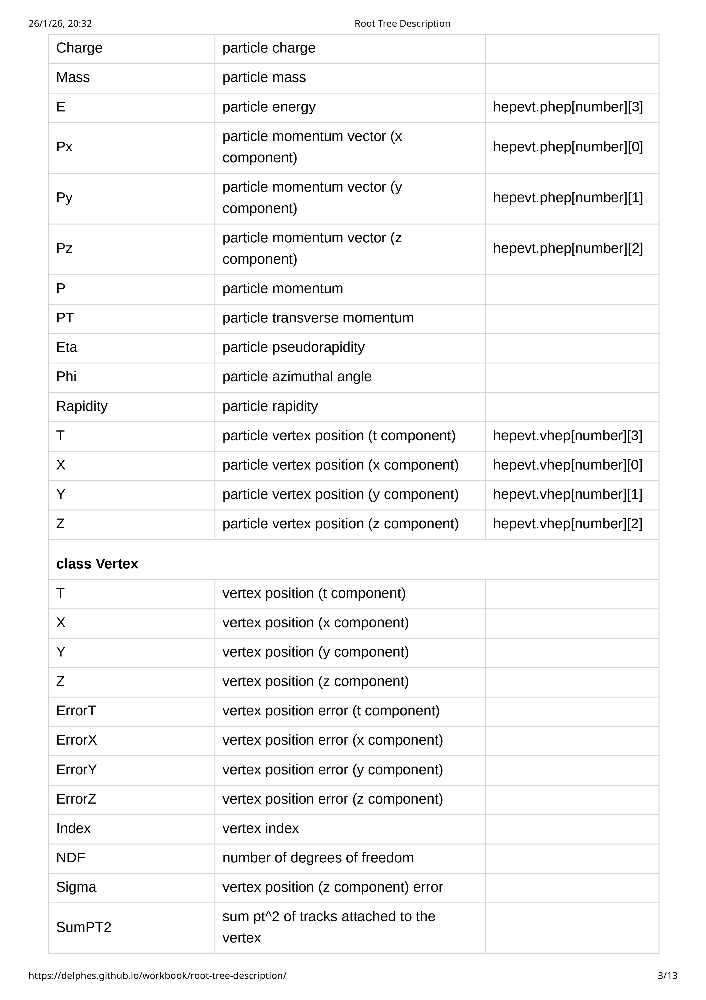

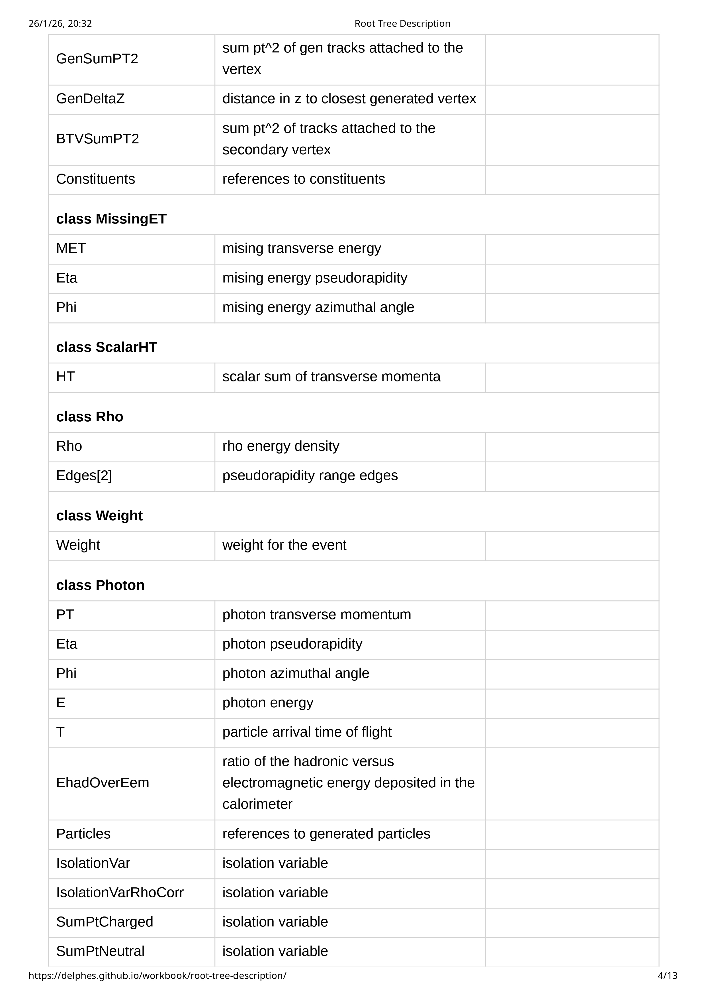

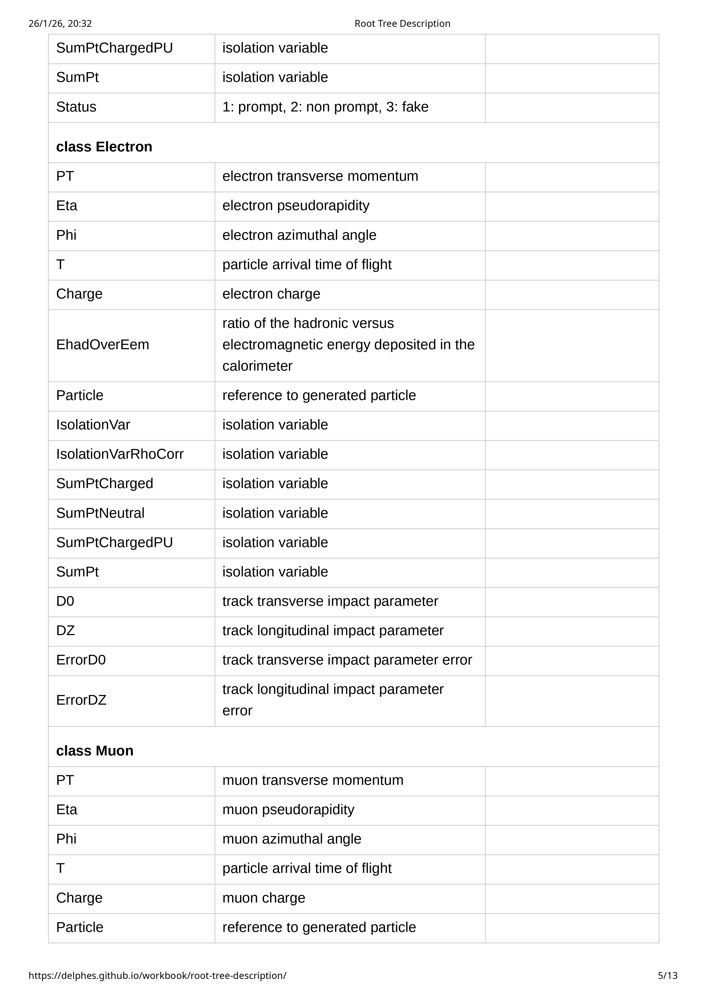

...

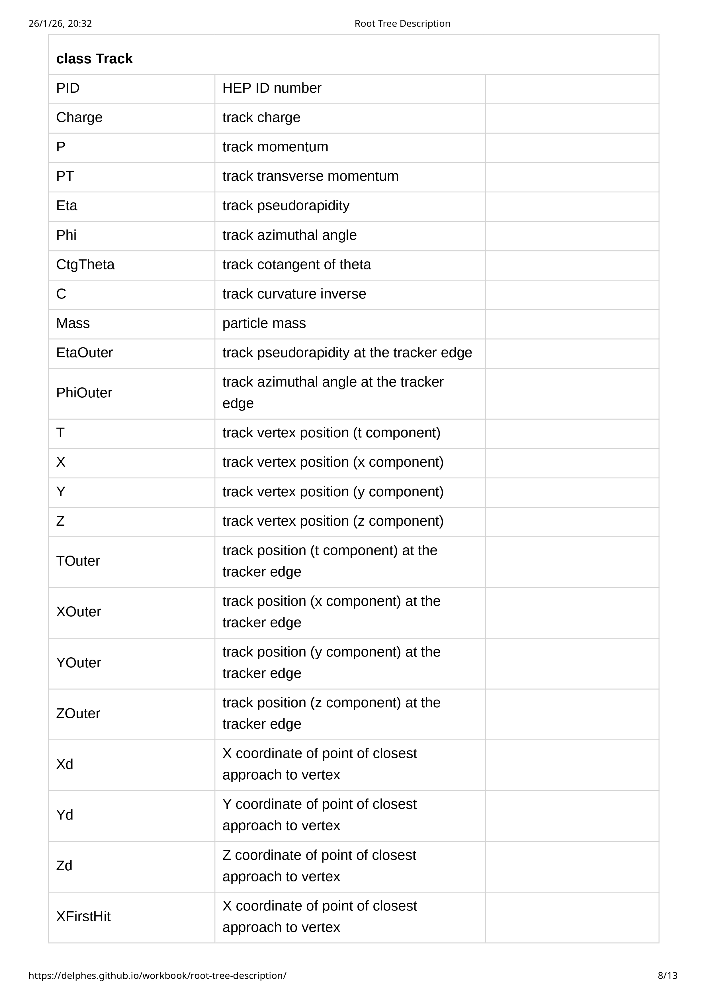

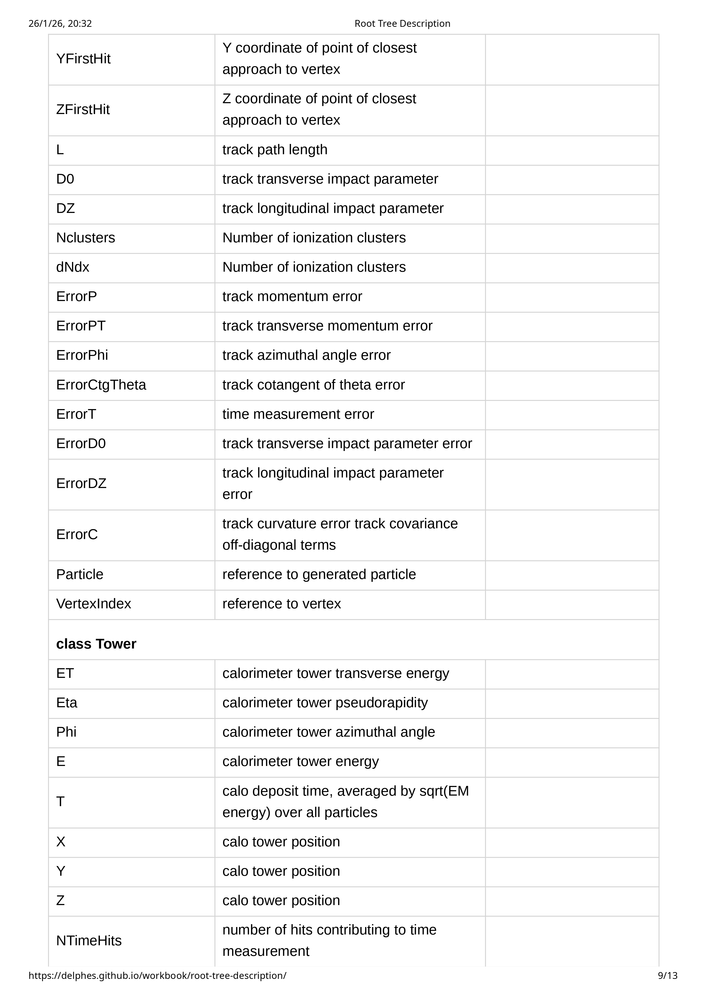

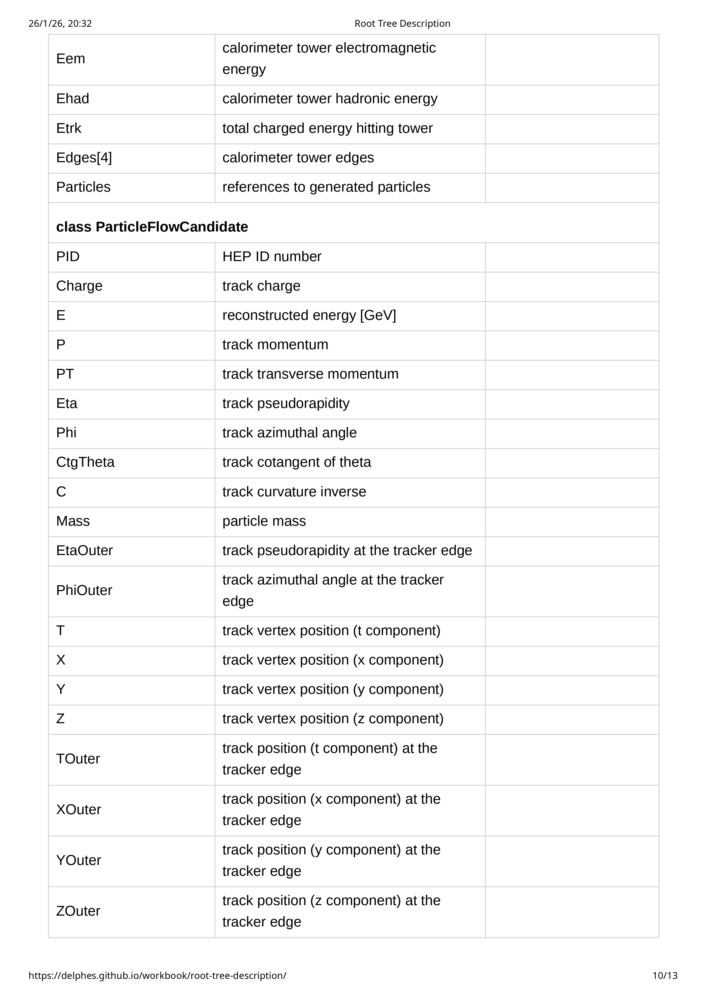

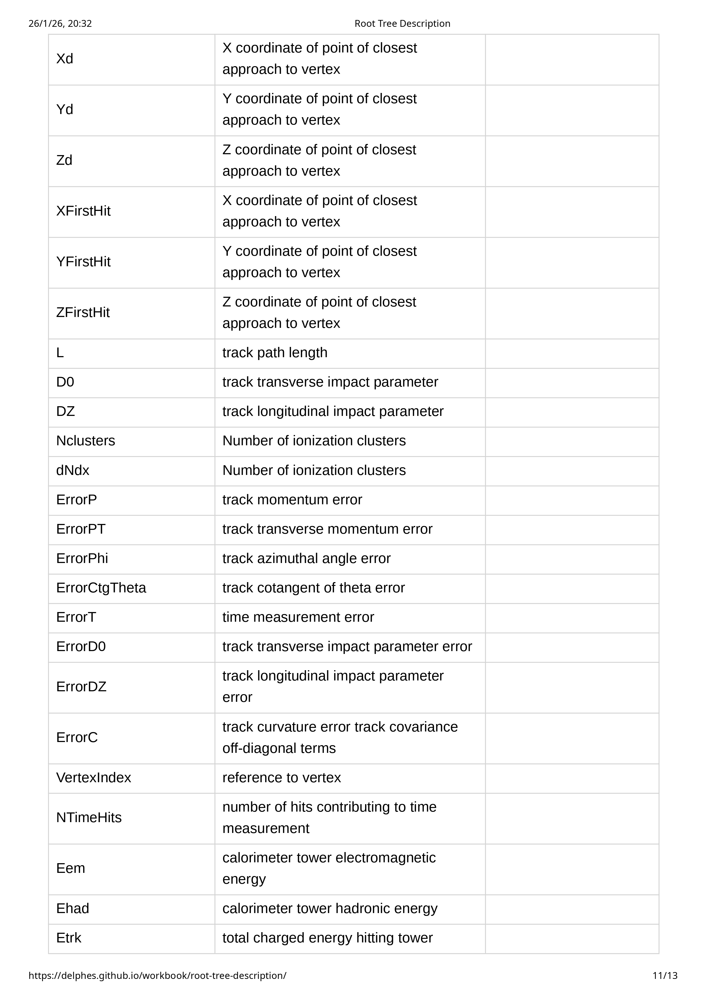

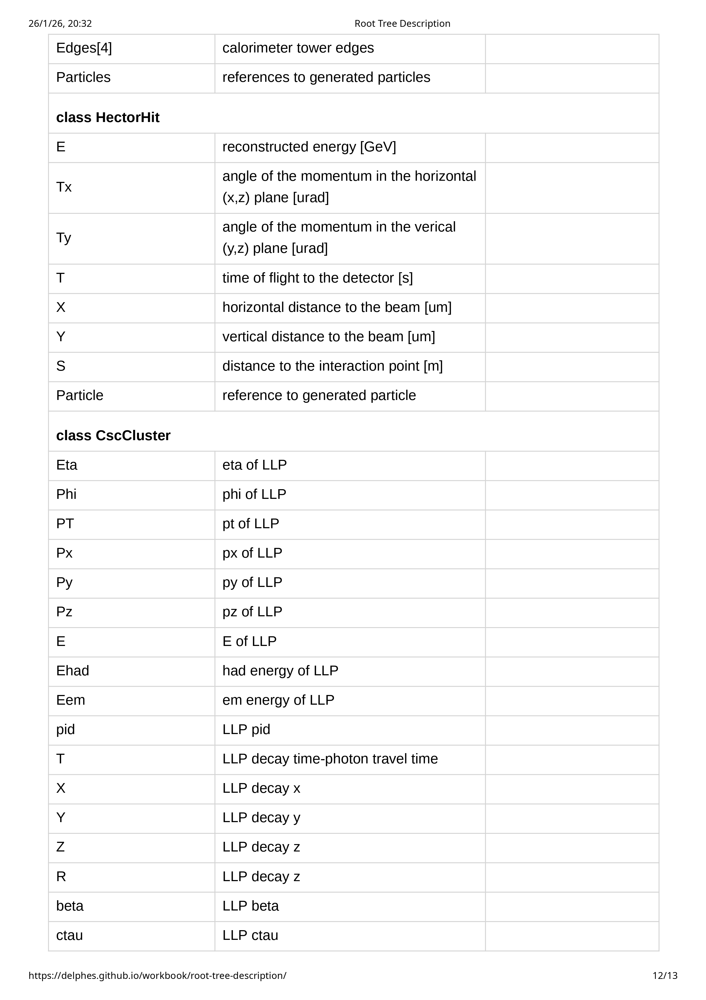

## Exploratory Analysis Using Uproot, Matplot and Seaborn

In [1]:
import uproot
import awkward as ak
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
# Import the .root file
file = uproot.open("/tf/Higgs-Boson-LHC-Collision-Detector/sigfcc_350.root")
# Check the file
print(file.keys())

['ProcessID0;1', 'ProcessID1;1', 'Delphes;1']


In [3]:
# Open the tree Delphes, which contains the necessary information of the simulation
tree = file["Delphes"]

# tree.show() 

In [4]:
# Check the keys of the tree so you can know what are you going to work with
tree.keys()

['Event',
 'Event/Event.fUniqueID',
 'Event/Event.fBits',
 'Event/Event.Number',
 'Event/Event.ReadTime',
 'Event/Event.ProcTime',
 'Event/Event.ProcessID',
 'Event/Event.MPI',
 'Event/Event.Weight',
 'Event/Event.CrossSection',
 'Event/Event.CrossSectionError',
 'Event/Event.Scale',
 'Event/Event.AlphaQED',
 'Event/Event.AlphaQCD',
 'Event/Event.ID1',
 'Event/Event.ID2',
 'Event/Event.X1',
 'Event/Event.X2',
 'Event/Event.ScalePDF',
 'Event/Event.PDF1',
 'Event/Event.PDF2',
 'Event_size',
 'Weight',
 'Weight/Weight.fUniqueID',
 'Weight/Weight.fBits',
 'Weight/Weight.Weight',
 'Weight_size',
 'Particle',
 'Particle/Particle.fUniqueID',
 'Particle/Particle.fBits',
 'Particle/Particle.PID',
 'Particle/Particle.Status',
 'Particle/Particle.IsPU',
 'Particle/Particle.M1',
 'Particle/Particle.M2',
 'Particle/Particle.D1',
 'Particle/Particle.D2',
 'Particle/Particle.Charge',
 'Particle/Particle.Mass',
 'Particle/Particle.E',
 'Particle/Particle.Px',
 'Particle/Particle.Py',
 'Particle/Parti

### Acotation
This case some of the data is not explained in the Root Tree description given above. I had the courtesy to investigate what each principal class was though I couldn't them find all:

- **GenVertex**. It allows decay vertices and you can get info about it
- **Track**. It is a paremetric representationf of the particle trajectory.
- **Tower**. It is related to the Calolimeter Tower.
- **EFlow"-"**. It gives the information obtained with the Energy Flow Algorithm, which separates the energy depositions in the calolimeter distinguishing between photons, charged tracks and Neutral Hadrons.
- **ParticleFlowCandidate**. Based on the particle flow (PF) algorithm which provides a global event description by reconstructing final-state particles and is central to event reconstruction in CMS.
- **PhotonIso**. Gives information about the isolated photons which are different from the photons created due to hadronic decays or inside jets.
- **GenMissingET**. I understood it as a missing transverse energy generator.
- **MissingET**. It gives information about the Missing Transverse Energy.

In [5]:
# In this case we're going to check the distribution of the eta P_t values for all events
# First we check what's inside the Particle tree
tree["Particle"].show()

name                 | typename                 | interpretation                
---------------------+--------------------------+-------------------------------
Particle             | int32_t                  | AsDtype('>i4')                
Particle.fUniqueID   | uint32_t[]               | AsJagged(AsDtype('>u4'))
Particle.fBits       | uint32_t[]               | AsJagged(AsDtype('>u4'))
Particle.PID         | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.Status      | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.IsPU        | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.M1          | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.M2          | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.D1          | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.D2          | int32_t[]                | AsJagged(AsDtype('>i4'))
Particle.Charge      | int32_t[]                | AsJagged(AsDtype('>i4'))
Particl

In [6]:
# This way we select the data that is important for us, e.g. the P_t of all particles

pt = tree["Particle/Particle.PT"].array(library="ak")

In [7]:
# If we check the data we'll see that it is separated for each event and for each particle
pt

<Array [[0, 0, 0, 0, ..., 25.5, 5.06, 1.37], ...] type='500000 * var * float32'>

In [8]:
# As we want to check the distribution of all the data we should flatten all the info so we can then graph
# for all events

pt_all = ak.flatten(pt)

# Notice the difference
pt_all

<Array [0, 0, 0, 0, 110, ..., 0.904, 1.9, 1.3, 3.58] type='68972806 * float32'>

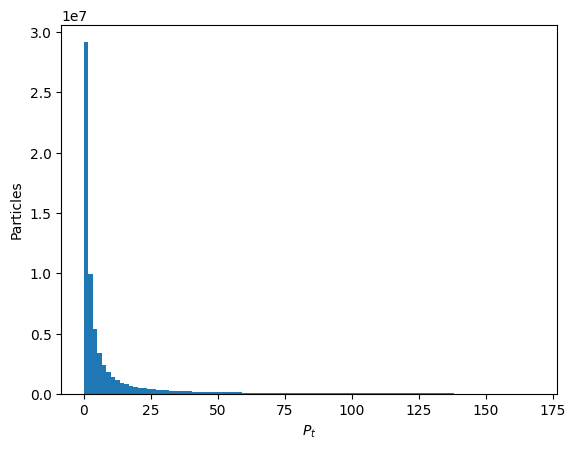

In [9]:
# Now we graph the distribution of the data
# First we'll do it with the Matplotlib library

plt.hist(pt_all, bins = 100)
plt.xlabel(r"$P_t$")
plt.ylabel("Particles")
plt.show()

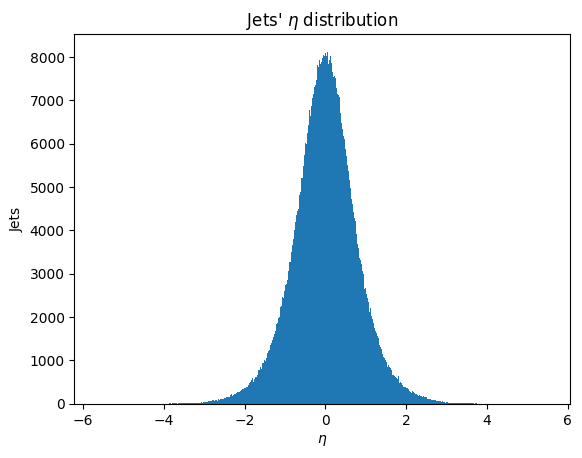

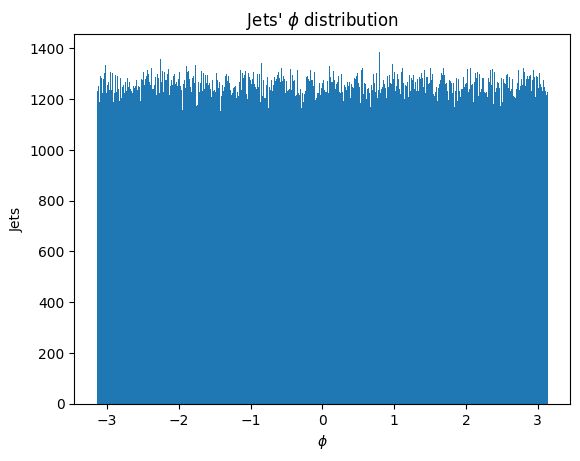

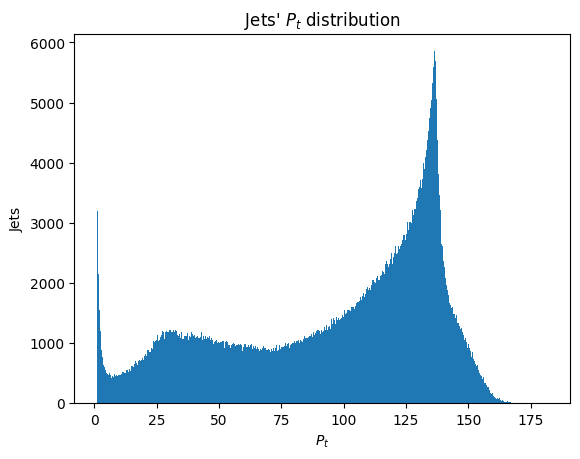

In [10]:
# Now, it is our interest in this case to see the distribution of the eta, phi and P_t values for each particle. 
# We'll do it for all the Jets, Electrons, Photons, Muons and the MissingET in the collisions of the simulator
# by using the Matplotlib library. 

# For the Jets we have: 

jets_eta = tree["Jet/Jet.Eta"].array(library = "ak")
jets_phi = tree["Jet/Jet.Phi"].array(library = "ak")
jets_pt = tree["Jet/Jet.PT"].array(library = "ak")

eta_jets = ak.flatten(jets_eta)
phi_jets = ak.flatten(jets_phi)
pt_jets = ak.flatten(jets_pt)

plt.hist(eta_jets, bins = 1000)
plt.xlabel(r"$\eta$")
plt.ylabel("Jets")
plt.title(r"Jets' $\eta$ distribution")
plt.show()

plt.hist(phi_jets, bins = 1000)
plt.xlabel(r"$\phi$")
plt.ylabel("Jets")
plt.title(r"Jets' $\phi$ distribution")
plt.show()

plt.hist(pt_jets, bins = 1000)
plt.xlabel(r"$P_t$")
plt.ylabel("Jets")
plt.title(r"Jets' $P_t$ distribution")
plt.show()

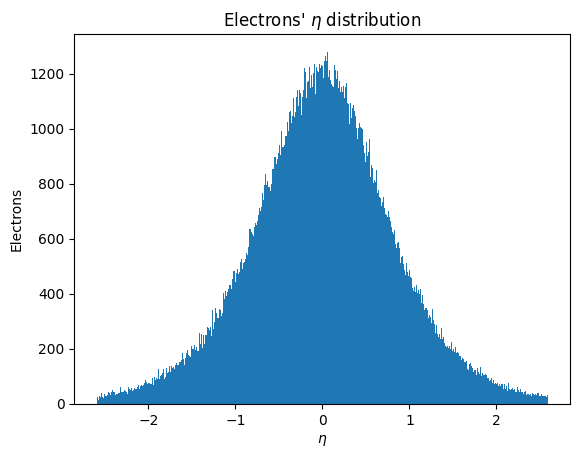

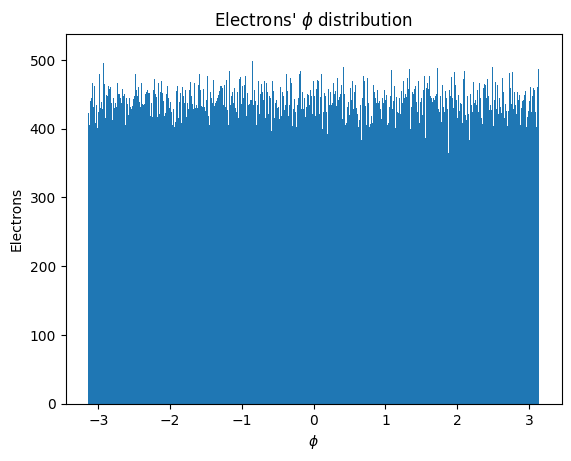

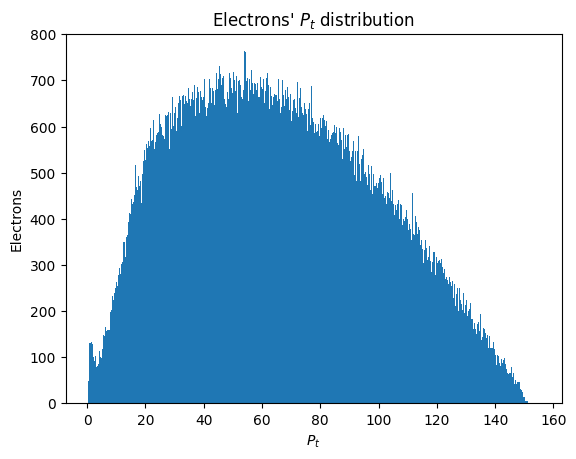

In [11]:
# For the Electrons we have: 

e_eta = tree["Electron/Electron.Eta"].array(library = "ak")
e_phi = tree["Electron/Electron.Phi"].array(library = "ak")
e_pt = tree["Electron/Electron.PT"].array(library = "ak")

eta_e = ak.flatten(e_eta)
phi_e = ak.flatten(e_phi)
pt_e = ak.flatten(e_pt)

plt.hist(eta_e, bins = 1000)
plt.xlabel(r"$\eta$")
plt.ylabel("Electrons")
plt.title(r"Electrons' $\eta$ distribution")
plt.show()

plt.hist(phi_e, bins = 1000)
plt.xlabel(r"$\phi$")
plt.ylabel("Electrons")
plt.title(r"Electrons' $\phi$ distribution")
plt.show()

plt.hist(pt_e, bins = 1000)
plt.xlabel(r"$P_t$")
plt.ylabel("Electrons")
plt.title(r"Electrons' $P_t$ distribution")
plt.show()

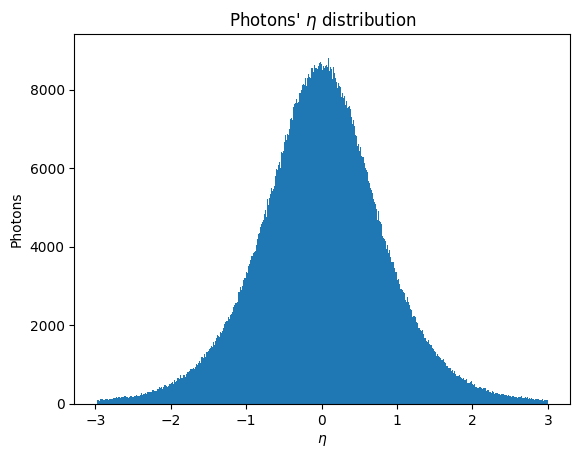

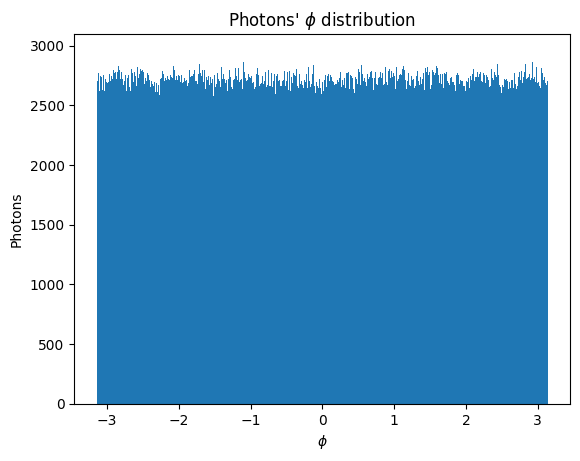

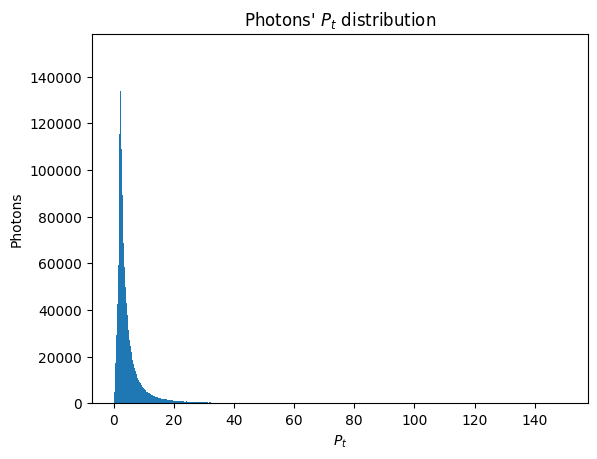

In [12]:
# For the Photons we have: 

p_eta = tree["Photon/Photon.Eta"].array(library = "ak")
p_phi = tree["Photon/Photon.Phi"].array(library = "ak")
p_pt = tree["Photon/Photon.PT"].array(library = "ak")

eta_p = ak.flatten(p_eta)
phi_p = ak.flatten(p_phi)
pt_p = ak.flatten(p_pt)

plt.hist(eta_p, bins = 1000)
plt.xlabel(r"$\eta$")
plt.ylabel("Photons")
plt.title(r"Photons' $\eta$ distribution")
plt.show()

plt.hist(phi_p, bins = 1000)
plt.xlabel(r"$\phi$")
plt.ylabel("Photons")
plt.title(r"Photons' $\phi$ distribution")
plt.show()

plt.hist(pt_p, bins = 1000)
plt.xlabel(r"$P_t$")
plt.ylabel("Photons")
plt.title(r"Photons' $P_t$ distribution")
plt.show()

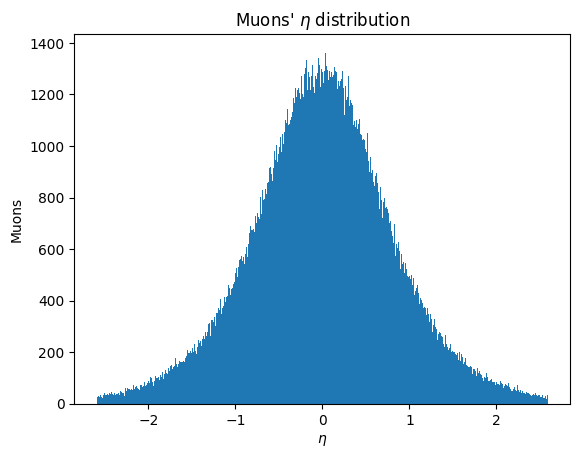

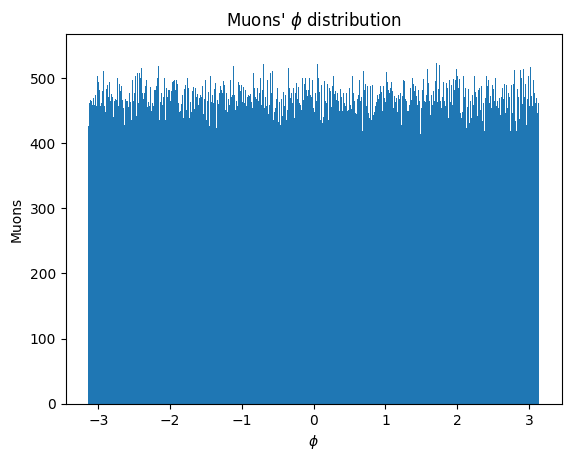

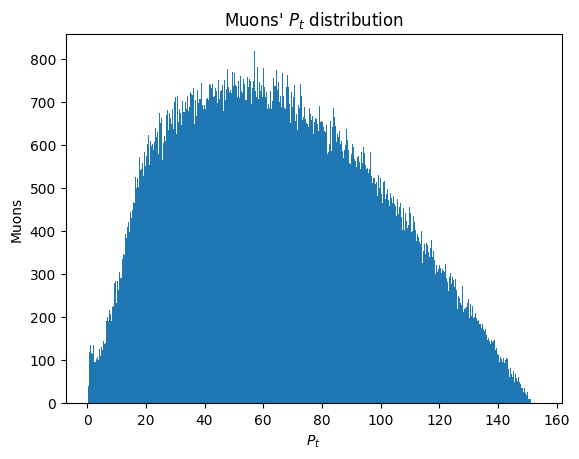

In [13]:
# For the Muons we have: 

m_eta = tree["Muon/Muon.Eta"].array(library = "ak")
m_phi = tree["Muon/Muon.Phi"].array(library = "ak")
m_pt = tree["Muon/Muon.PT"].array(library = "ak")

eta_m = ak.flatten(m_eta)
phi_m = ak.flatten(m_phi)
pt_m = ak.flatten(m_pt)

plt.hist(eta_m, bins = 1000)
plt.xlabel(r"$\eta$")
plt.ylabel("Muons")
plt.title(r"Muons' $\eta$ distribution")
plt.show()

plt.hist(phi_m, bins = 1000)
plt.xlabel(r"$\phi$")
plt.ylabel("Muons")
plt.title(r"Muons' $\phi$ distribution")
plt.show()

plt.hist(pt_m, bins = 1000)
plt.xlabel(r"$P_t$")
plt.ylabel("Muons")
plt.title(r"Muons' $P_t$ distribution")
plt.show()

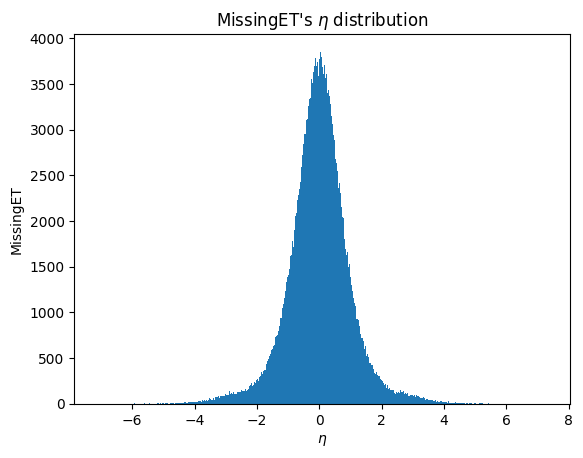

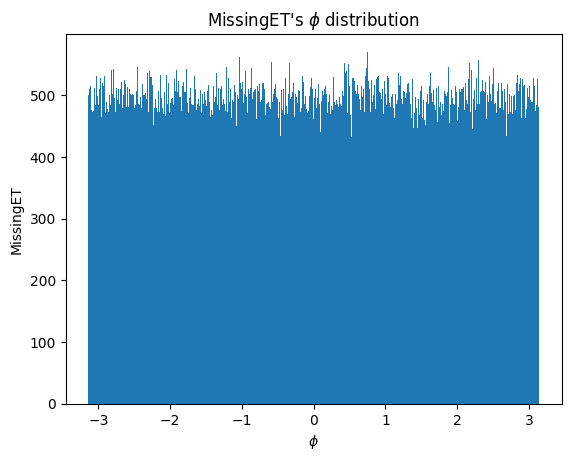

In [14]:
# For the MissingET we have: 

met_eta = tree["MissingET/MissingET.Eta"].array(library = "ak")
met_phi = tree["MissingET/MissingET.Phi"].array(library = "ak")

eta_met = ak.flatten(met_eta)
phi_met = ak.flatten(met_phi)

plt.hist(eta_met, bins = 1000)
plt.xlabel(r"$\eta$")
plt.ylabel("MissingET")
plt.title(r"MissingET's $\eta$ distribution")
plt.show()

plt.hist(phi_met, bins = 1000)
plt.xlabel(r"$\phi$")
plt.ylabel("MissingET")
plt.title(r"MissingET's $\phi$ distribution")
plt.show()

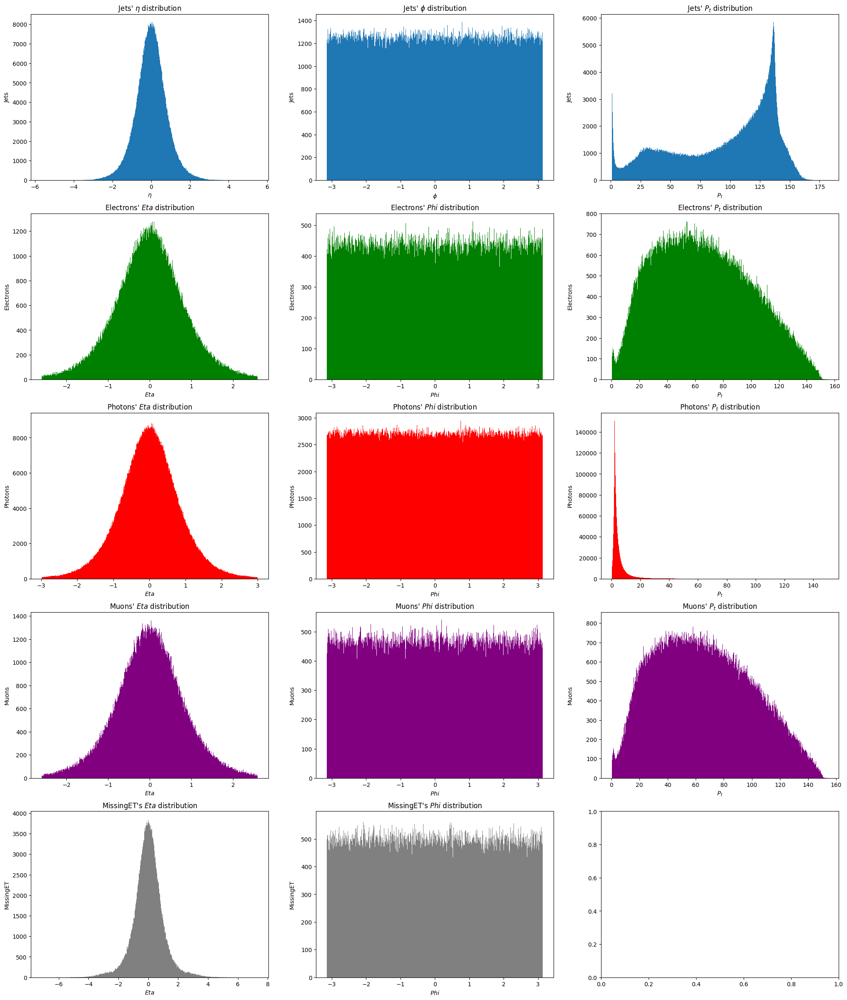

In [15]:
# All the distributions can be seen in the following image:

fig, axs = plt.subplots(5, 3, figsize = (25, 30))

ax = axs[0][0]
ax.hist(eta_jets, bins = 1000)
ax.set_xlabel(r"$\eta$")
ax.set_ylabel("Jets")
ax.set_title(r"Jets' $\eta$ distribution")

ax = axs[0][1]
ax.hist(phi_jets, bins = 1000)
ax.set_xlabel(r"$\phi$")
ax.set_ylabel("Jets")
ax.set_title(r"Jets' $\phi$ distribution")

ax = axs[0][2]
ax.hist(pt_jets, bins = 1000)
ax.set_xlabel(r"$P_t$")
ax.set_ylabel("Jets")
ax.set_title(r"Jets' $P_t$ distribution")

##########################################

ax = axs[1][0]
ax.hist(eta_e, bins = 1000, color = "green")
ax.set_xlabel(r"$Eta$")
ax.set_ylabel("Electrons")
ax.set_title(r"Electrons' $Eta$ distribution")

ax = axs[1][1]
ax.hist(phi_e, bins = 1000, color = "green")
ax.set_xlabel(r"$Phi$")
ax.set_ylabel("Electrons")
ax.set_title(r"Electrons' $Phi$ distribution")

ax = axs[1][2]
ax.hist(pt_e, bins = 1000, color = "green")
ax.set_xlabel(r"$P_t$")
ax.set_ylabel("Electrons")
ax.set_title(r"Electrons' $P_t$ distribution")

##########################################

ax = axs[2][0]
ax.hist(eta_p, bins = 1000, color = "red")
ax.set_xlabel(r"$Eta$")
ax.set_ylabel("Photons")
ax.set_title(r"Photons' $Eta$ distribution")

ax = axs[2][1]
ax.hist(phi_p, bins = 1000, color = "red")
ax.set_xlabel(r"$Phi$")
ax.set_ylabel("Photons")
ax.set_title(r"Photons' $Phi$ distribution")

ax = axs[2][2]
ax.hist(pt_p, bins = 1000, color = "red")
ax.set_xlabel(r"$P_t$")
ax.set_ylabel("Photons")
ax.set_title(r"Photons' $P_t$ distribution")

##########################################

ax = axs[3][0]
ax.hist(eta_m, bins = 1000, color = "purple")
ax.set_xlabel(r"$Eta$")
ax.set_ylabel("Muons")
ax.set_title(r"Muons' $Eta$ distribution")

ax = axs[3][1]
ax.hist(phi_m, bins = 1000, color = "purple")
ax.set_xlabel(r"$Phi$")
ax.set_ylabel("Muons")
ax.set_title(r"Muons' $Phi$ distribution")

ax = axs[3][2]
ax.hist(pt_m, bins = 1000, color = "purple")
ax.set_xlabel(r"$P_t$")
ax.set_ylabel("Muons")
ax.set_title(r"Muons' $P_t$ distribution")

##########################################

ax = axs[4][0]
ax.hist(eta_met, bins = 1000, color = "gray")
ax.set_xlabel(r"$Eta$")
ax.set_ylabel("MissingET")
ax.set_title(r"MissingET's $Eta$ distribution")

ax = axs[4][1]
ax.hist(phi_met, bins = 1000, color = "gray")
ax.set_xlabel(r"$Phi$")
ax.set_ylabel("MissingET")
ax.set_title(r"MissingET's $Phi$ distribution")

fig.align_labels()

plt.show()

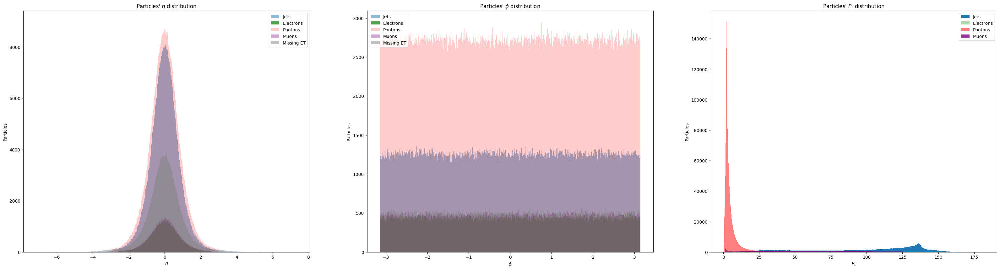

In [16]:
# And in order to compare we can overlap them:

fig, axs = plt.subplots(1,3, figsize = (40, 10))

ax = axs[0]
ax.hist(eta_jets, bins = 1000, alpha = 0.5, label = "Jets")
ax.hist(eta_e, bins = 1000, color = "green", alpha = 0.7, label = "Electrons")
ax.hist(eta_p, bins = 1000, color = "red", alpha = 0.2, label = "Photons")
ax.hist(eta_m, bins = 1000, color = "purple", alpha = 0.35, label = "Muons")
ax.hist(eta_met, bins = 1000, color = "gray", alpha = 0.5, label = "Missing ET")
ax.set_xlabel(r"$\eta$")
ax.set_ylabel("Particles")
ax.legend()
ax.set_title(r"Particles' $\eta$ distribution")


ax = axs[1]
ax.hist(phi_jets, bins = 1000, alpha = 0.5, label = "Jets")
ax.hist(phi_e, bins = 1000, color = "green", alpha = 0.7, label = "Electrons")
ax.hist(phi_p, bins = 1000, color = "red", alpha = 0.2, label = "Photons")
ax.hist(phi_m, bins = 1000, color = "purple", alpha = 0.35, label = "Muons")
ax.hist(phi_met, bins = 1000, color = "gray", alpha = 0.5, label = "Missing ET")
ax.set_xlabel(r"$\phi$")
ax.set_ylabel("Particles")
ax.legend()
ax.set_title(r"Particles' $\phi$ distribution")


ax = axs[2]
ax.hist(pt_jets, bins = 1000, label = "Jets")
ax.hist(pt_e, bins = 1000, color = "green", alpha = 0.3, label = "Electrons")
ax.hist(pt_p, bins = 1000, color = "red", alpha = 0.5, label = "Photons") 
ax.hist(pt_m, bins = 1000, color = "purple", alpha = 0.8, label = "Muons")
ax.set_xlabel(r"$P_t$")
ax.set_ylabel("Particles")
ax.legend()
ax.set_title(r"Particles' $P_t$ distribution")

fig.align_labels()

plt.show()

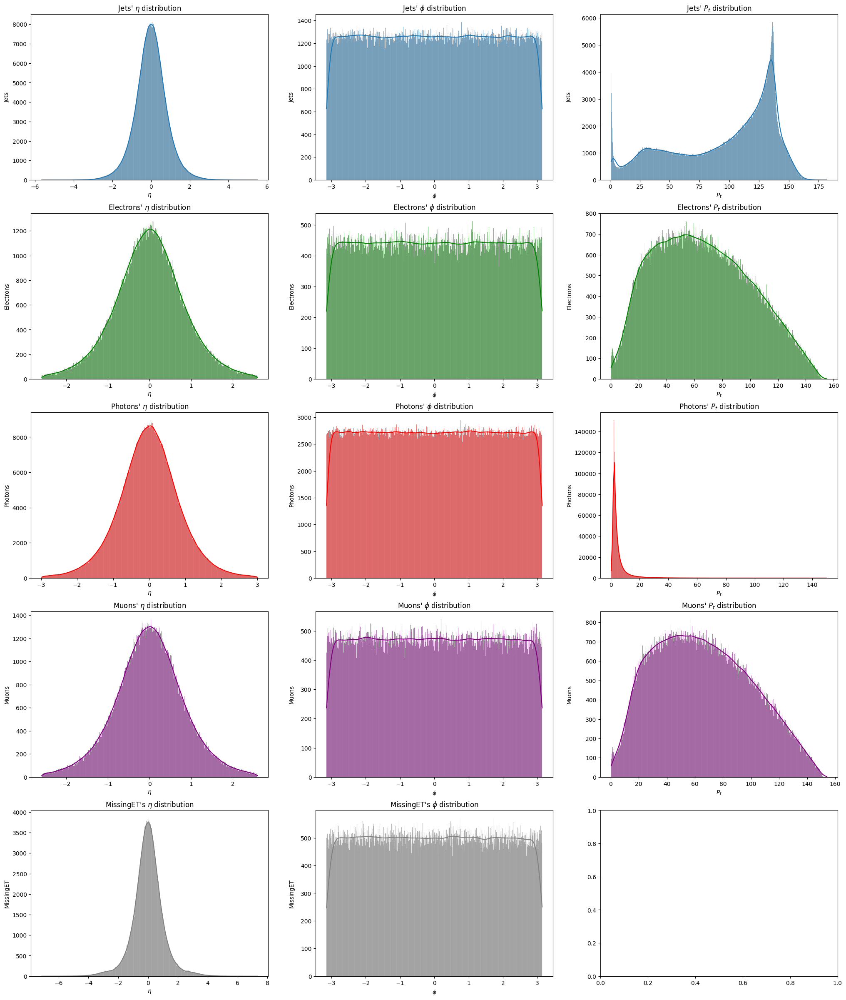

In [18]:
# Now, we'll do a KDE using the seaborn library. We can graph

fig, axs = plt.subplots(5, 3, figsize = (25, 30))

sns.histplot(eta_jets, bins = 1000, kde = True, ax = axs[0][0])
axs[0][0].set_xlabel(r"$\eta$")
axs[0][0].set_ylabel("Jets")
axs[0][0].set_title(r"Jets' $\eta$ distribution")

sns.histplot(phi_jets, bins = 1000, kde = True, ax = axs[0][1])
axs[0][1].set_xlabel(r"$\phi$")
axs[0][1].set_ylabel("Jets")
axs[0][1].set_title(r"Jets' $\phi$ distribution")

sns.histplot(pt_jets, bins = 1000, kde = True, ax = axs[0][2])
axs[0][2].set_xlabel(r"$P_t$")
axs[0][2].set_ylabel("Jets")
axs[0][2].set_title(r"Jets' $P_t$ distribution")

##########################################

sns.histplot(eta_e, bins = 1000, kde = True, ax = axs[1][0], color = "green")
axs[1][0].set_xlabel(r"$\eta$")
axs[1][0].set_ylabel("Electrons")
axs[1][0].set_title(r"Electrons' $\eta$ distribution")

sns.histplot(phi_e, bins = 1000, kde = True, ax = axs[1][1], color = "green")
axs[1][1].set_xlabel(r"$\phi$")
axs[1][1].set_ylabel("Electrons")
axs[1][1].set_title(r"Electrons' $\phi$ distribution")

sns.histplot(pt_e, bins = 1000, kde = True, ax = axs[1][2], color = "green")
axs[1][2].set_xlabel(r"$P_t$")
axs[1][2].set_ylabel("Electrons")
axs[1][2].set_title(r"Electrons' $P_t$ distribution")

##########################################

sns.histplot(eta_p, bins = 1000, kde = True, ax = axs[2][0], color = "red")
axs[2][0].set_xlabel(r"$\eta$")
axs[2][0].set_ylabel("Photons")
axs[2][0].set_title(r"Photons' $\eta$ distribution")

sns.histplot(phi_p, bins = 1000, kde = True, ax = axs[2][1], color = "red")
axs[2][1].set_xlabel(r"$\phi$")
axs[2][1].set_ylabel("Photons")
axs[2][1].set_title(r"Photons' $\phi$ distribution")

sns.histplot(pt_p, bins = 1000, kde = True, ax = axs[2][2], color = "red")
axs[2][2].set_xlabel(r"$P_t$")
axs[2][2].set_ylabel("Photons")
axs[2][2].set_title(r"Photons' $P_t$ distribution")

##########################################

sns.histplot(eta_m, bins = 1000, kde = True, ax = axs[3][0], color = "purple")
axs[3][0].set_xlabel(r"$\eta$")
axs[3][0].set_ylabel("Muons")
axs[3][0].set_title(r"Muons' $\eta$ distribution")

sns.histplot(phi_m, bins = 1000, kde = True, ax = axs[3][1], color = "purple")
axs[3][1].set_xlabel(r"$\phi$")
axs[3][1].set_ylabel("Muons")
axs[3][1].set_title(r"Muons' $\phi$ distribution")

sns.histplot(pt_m, bins = 1000, kde = True, ax = axs[3][2], color = "purple")
axs[3][2].set_xlabel(r"$P_t$")
axs[3][2].set_ylabel("Muons")
axs[3][2].set_title(r"Muons' $P_t$ distribution")

##########################################

sns.histplot(eta_met, bins = 1000, kde = True, ax = axs[4][0], color = "gray")
axs[4][0].set_xlabel(r"$\eta$")
axs[4][0].set_ylabel("MissingET")
axs[4][0].set_title(r"MissingET's $\eta$ distribution")

sns.histplot(phi_met, bins = 1000, kde = True, ax = axs[4][1], color = "gray")
axs[4][1].set_xlabel(r"$\phi$")
axs[4][1].set_ylabel("MissingET")
axs[4][1].set_title(r"MissingET's $\phi$ distribution")

fig.align_labels()

plt.show()

We have sucessfully explored the data using Uproot!